In [1]:
#Memasukkan Libraries

import requests
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from io import BytesIO
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report

In [2]:
# Link dokumen Dropbox 2023
link1 = "https://www.dropbox.com/scl/fi/ykfzlt9y5u0u6ytf78b92/KANWIL-RSK-2023.xlsx?cloud_editor=excel&dl=0&rlkey=lvqjf1r2807m0aovl461y9ryr"


response1 = requests.get(link1, params={'dl': 1})
dataframe2023 = pd.read_excel(BytesIO(response1.content), engine="openpyxl", sheet_name="BUKU REGISTER")
print(dataframe2023.head())


               REF BPHTB             REF Verif             KPKNL  \
0  KPKNL Pekan Baru11051  KPKNL Pekan Baru1105  KPKNL Pekan Baru   
1  KPKNL Pekan Baru10201  KPKNL Pekan Baru1020  KPKNL Pekan Baru   
2        KPKNL Batam8991        KPKNL Batam899       KPKNL Batam   
3        KPKNL Batam1771        KPKNL Batam177       KPKNL Batam   
4        KPKNL Batam5381        KPKNL Batam538       KPKNL Batam   

  NOMOR REGISTER LELANG TANGGAL REGISTER LELANG NO. TIKET PERMOHONAN ONLINE  \
0                  1124              2023-04-10                      5SQN0T   
1                  1196              2023-04-14                      WPH9TA   
2                   571                     NaT                      CSTPM1   
3                   115              2023-01-13                      P1A0NR   
4                   315                     NaT                      XLRJIL   

                         NAMA PEMOHON LELANG/PENJUAL  \
0  PT Bank Rakyat Indonesia.Tbk, PEKANBARU TUANKU...   
1  T

In [3]:
# Link dokumen Dropbox 2022
link2 = "https://www.dropbox.com/s/yynrq33m3akbokq/KANWIL%20RSK%202022.xlsx?cloud_editor=excel&dl=0"


response2 = requests.get(link2, params={'dl': 1})
dataframe2022 = pd.read_excel(BytesIO(response2.content), engine="openpyxl", sheet_name="BUKU REGISTER")
print(dataframe2022.head())


                  REF BPHTB                REF Verif             KPKNL  \
0       KPKNL Pekan Baru981       KPKNL Pekan Baru98  KPKNL Pekan Baru   
1      KPKNL Pekan Baru1961      KPKNL Pekan Baru196  KPKNL Pekan Baru   
2      KPKNL Pekan Baru1841      KPKNL Pekan Baru184  KPKNL Pekan Baru   
3      KPKNL Pekan Baru1556      KPKNL Pekan Baru155  KPKNL Pekan Baru   
4  KPKNL Padang221/08/20224  KPKNL Padang221/08/2022      KPKNL Padang   

  NOMOR REGISTER LELANG TANGGAL REGISTER LELANG NO. TIKET PERMOHONAN ONLINE  \
0                    21              2022-01-22                      RZWQEN   
1                    79              2022-04-07                      R2BIUP   
2                    12              2022-03-14                      5NWPYU   
3                    19              2022-03-16                      3WLF5T   
4                   187              2022-05-09                      NS05GH   

                         NAMA PEMOHON LELANG/PENJUAL  \
0  PT. Bank Mandiri (Per

In [4]:
# Link dokumen Dropbox 2021
link3 = "https://www.dropbox.com/scl/fi/ovc52gteifujvf9vcsycz/KANWIL-RSK-2021.xlsx?cloud_editor=excel&dl=0&rlkey=34kr0r0gt65hhz4m34bvnuxz1"

response3 = requests.get(link3, params={'dl': 1})
dataframe2021 = pd.read_excel(BytesIO(response3.content), engine="openpyxl", sheet_name="BUKU REGISTER")
print(dataframe2021.head())


          REF BPHTB       REF Verif        KPKNL  NOMOR REGISTER LELANG  \
0   KPKNL Batam3193  KPKNL Batam319  KPKNL Batam                  231.0   
1   KPKNL Batam3194  KPKNL Batam319  KPKNL Batam                  231.0   
2   KPKNL Batam3195  KPKNL Batam319  KPKNL Batam                  231.0   
3   KPKNL Batam3192  KPKNL Batam319  KPKNL Batam                  231.0   
4  KPKNL Batam31910  KPKNL Batam319  KPKNL Batam                  231.0   

  TANGGAL REGISTER LELANG NO. TIKET PERMOHONAN ONLINE  \
0     2021-06-16 00:00:00                      IU42FX   
1     2021-06-16 00:00:00                      IU42FX   
2     2021-06-16 00:00:00                      IU42FX   
3     2021-06-16 00:00:00                      IU42FX   
4     2021-06-16 00:00:00                      IU42FX   

   NAMA PEMOHON LELANG/PENJUAL  \
0  UPBU Kelas III Dabo Singkep   
1  UPBU Kelas III Dabo Singkep   
2  UPBU Kelas III Dabo Singkep   
3  UPBU Kelas III Dabo Singkep   
4  UPBU Kelas III Dabo Singkep   

 

In [5]:
# Menggabungkan dataset
dataframes = {'2021': dataframe2021, '2022': dataframe2022, '2023': dataframe2023}
dataframe = pd.concat(dataframes.values(), keys=dataframes.keys())
print(dataframe.head())


               REF BPHTB       REF Verif        KPKNL NOMOR REGISTER LELANG  \
2021 0   KPKNL Batam3193  KPKNL Batam319  KPKNL Batam                 231.0   
     1   KPKNL Batam3194  KPKNL Batam319  KPKNL Batam                 231.0   
     2   KPKNL Batam3195  KPKNL Batam319  KPKNL Batam                 231.0   
     3   KPKNL Batam3192  KPKNL Batam319  KPKNL Batam                 231.0   
     4  KPKNL Batam31910  KPKNL Batam319  KPKNL Batam                 231.0   

       TANGGAL REGISTER LELANG NO. TIKET PERMOHONAN ONLINE  \
2021 0     2021-06-16 00:00:00                      IU42FX   
     1     2021-06-16 00:00:00                      IU42FX   
     2     2021-06-16 00:00:00                      IU42FX   
     3     2021-06-16 00:00:00                      IU42FX   
     4     2021-06-16 00:00:00                      IU42FX   

        NAMA PEMOHON LELANG/PENJUAL  \
2021 0  UPBU Kelas III Dabo Singkep   
     1  UPBU Kelas III Dabo Singkep   
     2  UPBU Kelas III Dabo Singkep

In [6]:
#Memperbaiki Dtype dari Tanggal agar terbaca sebagai tanggal

dataframe["TANGGAL REGISTER LELANG"] = pd.to_datetime(dataframe['TANGGAL REGISTER LELANG'], errors='coerce')
dataframe["TANGGAL SURAT PERMOHONAN LELANG"] = pd.to_datetime(dataframe['TANGGAL SURAT PERMOHONAN LELANG'], errors='coerce')
dataframe["TANGGAL PENYETORAN KE KAS NEGARA"] = pd.to_datetime(dataframe['TANGGAL PENYETORAN KE KAS NEGARA'], errors='coerce')
dataframe["TANGGAL HASIL PENELITIAN KELENGKAPAN BERKAS"] = pd.to_datetime(dataframe['TANGGAL HASIL PENELITIAN KELENGKAPAN BERKAS'], errors='coerce')
dataframe["TANGGAL SURAT KELENGKAPAN BERKAS LELANG"] = pd.to_datetime(dataframe['TANGGAL SURAT KELENGKAPAN BERKAS LELANG'], errors='coerce')
dataframe["TANGGAL SURAT JAWABAN KELENGKAPAN BERKAS"] = pd.to_datetime(dataframe['TANGGAL SURAT JAWABAN KELENGKAPAN BERKAS'], errors='coerce')
dataframe["TANGGAL SURAT PENETAPAN JADWAL LELANG"] = pd.to_datetime(dataframe['TANGGAL SURAT PENETAPAN JADWAL LELANG'], errors='coerce')
dataframe["TANGGAL PEMBAYARAN OLEH PEMBELI"] = pd.to_datetime(dataframe['TANGGAL PEMBAYARAN OLEH PEMBELI'], errors='coerce')
dataframe["TANGGAL SURAT SETOR BPHTB"] = pd.to_datetime(dataframe['TANGGAL SURAT SETOR BPHTB'], errors='coerce')
dataframe["TANGGAL PENYELESAIAN MINUTA RL"] = pd.to_datetime(dataframe['TANGGAL PENYELESAIAN MINUTA RL'], errors='coerce')


dataframe.info()

<ipython-input-6-c21ab340d950>:6: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  dataframe["TANGGAL HASIL PENELITIAN KELENGKAPAN BERKAS"] = pd.to_datetime(dataframe['TANGGAL HASIL PENELITIAN KELENGKAPAN BERKAS'], errors='coerce')


<class 'pandas.core.frame.DataFrame'>
MultiIndex: 27125 entries, ('2021', 0) to ('2023', 9998)
Data columns (total 100 columns):
 #   Column                                                        Non-Null Count  Dtype         
---  ------                                                        --------------  -----         
 0   REF BPHTB                                                     20894 non-null  object        
 1   REF Verif                                                     20894 non-null  object        
 2   KPKNL                                                         20879 non-null  object        
 3   NOMOR REGISTER LELANG                                         15768 non-null  object        
 4   TANGGAL REGISTER LELANG                                       17295 non-null  datetime64[ns]
 5   NO. TIKET PERMOHONAN ONLINE                                   15776 non-null  object        
 6   NAMA PEMOHON LELANG/PENJUAL                                   20142 non-null  obje

In [7]:
# Kolom-kolom yang ingin diolah
columns_to_keep = [
    'KPKNL', 'KATEGORI  PEMOHON LELANG/PENJUAL', 'JENIS LELANG', 'JAMINAN PENAWARAN LELANG','KATEGORI BARANG', 'UMKM', 'SIFAT BARANG',
    'Jenis Lelang Umum', 'Quartal', 'Jenis Lelang Umum', 'NILAI LIMIT', 'Bulan Lelang', 'Tahun Lelang',
    'JUMLAH PESERTA LELANG', 'STATUS LELANG', 'JENIS PENAWARAN'
]

# Buat dataframe baru
dataframe_filtered = dataframe[columns_to_keep]
print(dataframe_filtered.info())


<class 'pandas.core.frame.DataFrame'>
MultiIndex: 27125 entries, ('2021', 0) to ('2023', 9998)
Data columns (total 16 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   KPKNL                             20879 non-null  object
 1   KATEGORI  PEMOHON LELANG/PENJUAL  20042 non-null  object
 2   JENIS LELANG                      20591 non-null  object
 3   JAMINAN PENAWARAN LELANG          9240 non-null   object
 4   KATEGORI BARANG                   15639 non-null  object
 5   UMKM                              16055 non-null  object
 6   SIFAT BARANG                      18117 non-null  object
 7   Jenis Lelang Umum                 27125 non-null  object
 8   Quartal                           27125 non-null  object
 9   Jenis Lelang Umum                 27125 non-null  object
 10  NILAI LIMIT                       17313 non-null  object
 11  Bulan Lelang                      27125 non-null  object
 12 

In [8]:
dataframe_filtered.isnull().sum()

KPKNL                                6246
KATEGORI  PEMOHON LELANG/PENJUAL     7083
JENIS LELANG                         6534
JAMINAN PENAWARAN LELANG            17885
KATEGORI BARANG                     11486
UMKM                                11070
SIFAT BARANG                         9008
Jenis Lelang Umum                       0
Quartal                                 0
Jenis Lelang Umum                       0
NILAI LIMIT                          9812
Bulan Lelang                            0
Tahun Lelang                            0
JUMLAH PESERTA LELANG               21864
STATUS LELANG                       10202
JENIS PENAWARAN                      9654
dtype: int64

In [9]:
#Mengatasi cell null / PREPATARION

# Mengisi nilai null pada kolom "JUMLAH PESERTA LELANG" dengan 0
dataframe_filtered['JUMLAH PESERTA LELANG'] = dataframe_filtered['JUMLAH PESERTA LELANG'].fillna(0)

# Mengisi nilai null pada kolom "JAMINAN PENAWARAN LELANG" dengan 0
dataframe_filtered['JAMINAN PENAWARAN LELANG'] = dataframe_filtered['JAMINAN PENAWARAN LELANG'].fillna(0)

# Mengisi nilai null pada kolom "JAMINAN PENAWARAN LELANG" dengan 0
dataframe_filtered['UMKM'] = dataframe_filtered['UMKM'].fillna('Tidak')

<ipython-input-9-e21012828648>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe_filtered['JUMLAH PESERTA LELANG'] = dataframe_filtered['JUMLAH PESERTA LELANG'].fillna(0)
<ipython-input-9-e21012828648>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe_filtered['JAMINAN PENAWARAN LELANG'] = dataframe_filtered['JAMINAN PENAWARAN LELANG'].fillna(0)
<ipython-input-9-e21012828648>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_

In [10]:
# Penyrgaman kolm JAMINAN PENAWARAN LELANG
def seragamkan_jenis_penawaran(nilai):
    if pd.isnull(nilai):
        return 'Nilai Tidak Tersedia'  # Atau sesuaikan dengan nilai yang sesuai untuk kasus nilai null
    elif 'closed' in str(nilai).lower():
        return 'Internet Closed Bidding'
    elif 'kehadiran' in str(nilai).lower() or 'lisan' in str(nilai).lower():
        return 'Kehadiran Lisan'
    else:
        return 'Internet Open Bidding'

dataframe_filtered['JENIS PENAWARAN'] = dataframe_filtered['JAMINAN PENAWARAN LELANG'].apply(seragamkan_jenis_penawaran)
print(dataframe_filtered['JENIS PENAWARAN'].value_counts())
dataframe_filtered.head()

JENIS PENAWARAN
Internet Open Bidding    27125
Name: count, dtype: int64


<ipython-input-10-632f61f83273>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe_filtered['JENIS PENAWARAN'] = dataframe_filtered['JAMINAN PENAWARAN LELANG'].apply(seragamkan_jenis_penawaran)


KPKNL KATEGORI  PEMOHON LELANG/PENJUAL         JENIS LELANG  \
2021 0  KPKNL Batam              KEMENTERIAN/LEMBAGA  BARANG MILIK NEGARA   
     1  KPKNL Batam              KEMENTERIAN/LEMBAGA  BARANG MILIK NEGARA   
     2  KPKNL Batam              KEMENTERIAN/LEMBAGA  BARANG MILIK NEGARA   
     3  KPKNL Batam              KEMENTERIAN/LEMBAGA  BARANG MILIK NEGARA   
     4  KPKNL Batam              KEMENTERIAN/LEMBAGA  BARANG MILIK NEGARA   

       JAMINAN PENAWARAN LELANG             KATEGORI BARANG   UMKM  \
2021 0                        0  Roda 2, Kendaraan Bermotor  Tidak   
     1                        0  Roda 2, Kendaraan Bermotor  Tidak   
     2                        0  Roda 2, Kendaraan Bermotor  Tidak   
     3                        0  Roda 2, Kendaraan Bermotor  Tidak   
     4                        0  Roda 4, Kendaraan Bermotor  Tidak   

       SIFAT BARANG   Jenis Lelang Umum Quartal   Jenis Lelang Umum  \
2021 0           BB  Non Eksekusi Wajib       2  Non Eksekusi Wajib   
     1           BB  Non Eksekusi Wajib       2  Non Eksekusi Wajib   
     2           BB  Non Eksekusi Wajib       2  Non Eksekusi Wajib   
     3           BB  Non Eksekusi Wajib       2  Non Eksekusi Wajib   
     4           BB  Non Eksekusi Wajib       2  Non Eksekusi Wajib   

       NILAI LIMIT Bulan Lelang Tahun Lelang JUMLAH PESERTA LELANG  \
2021 0      394000            6         2021                     0   
     1      594000            6         2021                     0   
     2      974000            6         2021                     0   
     3      345000            6         2021                     0   
     4    21397000            6         2021                     0   

       STATUS LELANG        JENIS PENAWARAN  
2021 0          LAKU  Internet Open Bidding  
     1          LAKU  Internet Open Bidding  
     2          LAKU  Internet Open Bidding  
     3          LAKU  Internet Open Bidding  
     4          LAKU  Internet Open Bidding

In [11]:
#Menghapus baris dengan nilai null

dataframe_filtered = dataframe_filtered.dropna()
dataframe_filtered = dataframe_filtered.reset_index(drop=True)


In [12]:
#Mengecek data yang memiliki kolom null
dataframe_filtered.isnull().sum()

KPKNL                               0
KATEGORI  PEMOHON LELANG/PENJUAL    0
JENIS LELANG                        0
JAMINAN PENAWARAN LELANG            0
KATEGORI BARANG                     0
UMKM                                0
SIFAT BARANG                        0
Jenis Lelang Umum                   0
Quartal                             0
Jenis Lelang Umum                   0
NILAI LIMIT                         0
Bulan Lelang                        0
Tahun Lelang                        0
JUMLAH PESERTA LELANG               0
STATUS LELANG                       0
JENIS PENAWARAN                     0
dtype: int64

In [13]:
dataframe_filtered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14303 entries, 0 to 14302
Data columns (total 16 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   KPKNL                             14303 non-null  object
 1   KATEGORI  PEMOHON LELANG/PENJUAL  14303 non-null  object
 2   JENIS LELANG                      14303 non-null  object
 3   JAMINAN PENAWARAN LELANG          14303 non-null  object
 4   KATEGORI BARANG                   14303 non-null  object
 5   UMKM                              14303 non-null  object
 6   SIFAT BARANG                      14303 non-null  object
 7   Jenis Lelang Umum                 14303 non-null  object
 8   Quartal                           14303 non-null  object
 9   Jenis Lelang Umum                 14303 non-null  object
 10  NILAI LIMIT                       14303 non-null  object
 11  Bulan Lelang                      14303 non-null  object
 12  Tahun Lelang      

In [14]:
#Menyesuaikan data type pada kolom kolom lain

# Membersihkan nilai yang tidak dapat diubah menjadi float
dataframe_filtered['JAMINAN PENAWARAN LELANG'] = dataframe_filtered['JAMINAN PENAWARAN LELANG'].replace('-', '0')  # Ganti dengan '0', atau sesuaikan dengan nilai yang sesuai

# Konversi 'JAMINAN PENAWARAN LELANG' dan 'NILAI LIMIT' menjadi float
dataframe_filtered['JAMINAN PENAWARAN LELANG'] = pd.to_numeric(dataframe_filtered['JAMINAN PENAWARAN LELANG'], errors='coerce')
dataframe_filtered['NILAI LIMIT'] = pd.to_numeric(dataframe_filtered['NILAI LIMIT'], errors='coerce')

# Membersihkan nilai yang tidak dapat diubah menjadi int
dataframe_filtered['Quartal'] = dataframe_filtered['Quartal'].replace('-', '0')  # Ganti dengan '0', atau sesuaikan dengan nilai yang sesuai

# Konversi 'Quartal', 'Bulan Lelang', 'Tahun Lelang', 'JUMLAH PESERTA LELANG' menjadi int
dataframe_filtered['Quartal'] = pd.to_numeric(dataframe_filtered['Quartal'], errors='coerce').fillna(0).astype(int)
dataframe_filtered['Bulan Lelang'] = pd.to_numeric(dataframe_filtered['Bulan Lelang'], errors='coerce').fillna(0).astype(int)
dataframe_filtered['Tahun Lelang'] = pd.to_numeric(dataframe_filtered['Tahun Lelang'], errors='coerce').fillna(0).astype(int)
dataframe_filtered['JUMLAH PESERTA LELANG'] = pd.to_numeric(dataframe_filtered['JUMLAH PESERTA LELANG'], errors='coerce').fillna(0).astype(int)


dataframe_filtered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14303 entries, 0 to 14302
Data columns (total 16 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   KPKNL                             14303 non-null  object 
 1   KATEGORI  PEMOHON LELANG/PENJUAL  14303 non-null  object 
 2   JENIS LELANG                      14303 non-null  object 
 3   JAMINAN PENAWARAN LELANG          14300 non-null  float64
 4   KATEGORI BARANG                   14303 non-null  object 
 5   UMKM                              14303 non-null  object 
 6   SIFAT BARANG                      14303 non-null  object 
 7   Jenis Lelang Umum                 14303 non-null  object 
 8   Quartal                           14303 non-null  int64  
 9   Jenis Lelang Umum                 14303 non-null  object 
 10  NILAI LIMIT                       14303 non-null  int64  
 11  Bulan Lelang                      14303 non-null  int64  
 12  Tahu

In [15]:
# Memastikan kembali bahwa baris dengan nilai null di setiap kolom terhapus
dataframe_filtered = dataframe_filtered.dropna()
dataframe_filtered = dataframe_filtered.reset_index(drop=True)

dataframe_filtered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14300 entries, 0 to 14299
Data columns (total 16 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   KPKNL                             14300 non-null  object 
 1   KATEGORI  PEMOHON LELANG/PENJUAL  14300 non-null  object 
 2   JENIS LELANG                      14300 non-null  object 
 3   JAMINAN PENAWARAN LELANG          14300 non-null  float64
 4   KATEGORI BARANG                   14300 non-null  object 
 5   UMKM                              14300 non-null  object 
 6   SIFAT BARANG                      14300 non-null  object 
 7   Jenis Lelang Umum                 14300 non-null  object 
 8   Quartal                           14300 non-null  int64  
 9   Jenis Lelang Umum                 14300 non-null  object 
 10  NILAI LIMIT                       14300 non-null  int64  
 11  Bulan Lelang                      14300 non-null  int64  
 12  Tahu

In [16]:
#Menggunakan model Decision Tree

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

# Kolom target
y = dataframe_filtered['STATUS LELANG']

# Kolom fitur (hilangkan kolom target)
X = dataframe_filtered.drop('STATUS LELANG', axis=1)

# One-hot encoding (jika diperlukan)
X_encoded = pd.get_dummies(X, drop_first=True)

# training data dan test data
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Inisialisasi model Decision Tree
model = DecisionTreeClassifier(random_state=42)

# Latih model
model.fit(X_train, y_train)

# Evaluasi model
accuracy = model.score(X_test, y_test)
print(f'Accuracy: {accuracy:.2f}')


Accuracy: 0.81


In [17]:
#EVALUASI MODEL DAN PERBAIKAN MODEL DENGAN HYPER PARAMETER

from sklearn.model_selection import GridSearchCV

# Menentukan hyperparameter yang akan diuji
param_grid = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Inisialisasi model Decision Tree
model = DecisionTreeClassifier(random_state=42)

# Mencari kombinasi hyperparameter terbaik
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3)
grid_search.fit(X_train, y_train)

# Menampilkan kombinasi hyperparameter terbaik
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Menggunakan model dengan hyperparameter terbaik
best_model = grid_search.best_estimator_
accuracy = best_model.score(X_test, y_test)
print(f'Accuracy with Best Hyperparameters: {accuracy:.2f}')


Best Hyperparameters: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10}
Accuracy with Best Hyperparameters: 0.84


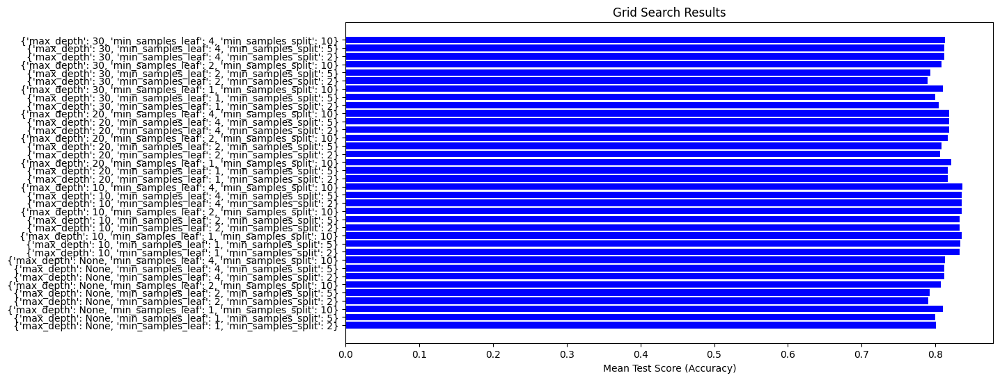

In [18]:
import matplotlib.pyplot as plt
import numpy as np

# Menyiapkan kombinasi hyperparameter dan skor akurasi
param_combinations = []
scores = []

for params, mean_score, std_score in zip(
    grid_search.cv_results_['params'],
    grid_search.cv_results_['mean_test_score'],
    grid_search.cv_results_['std_test_score']
):
    param_combinations.append(str(params))
    scores.append(mean_score)

# Menampilkan visualisasi
plt.figure(figsize=(12, 6))
plt.barh(param_combinations, scores, color='blue')
plt.xlabel('Mean Test Score (Accuracy)')
plt.title('Grid Search Results')
plt.show()


In [19]:
from io import StringIO
from sklearn.tree import export_graphviz
from IPython.display import Image
import pydotplus

# Visualisasi decision tree
dot_data = StringIO()
export_graphviz(best_model, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names=X_encoded.columns, class_names=best_model.classes_.astype(str))
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())


In [20]:
# Simpan visualisasi decision tree dalam format PDF
output_pdf_path = "decision_tree_visualization.pdf"
graph.write_pdf(output_pdf_path)

print(f"Decision Tree Visualization saved to: {output_pdf_path}")


Decision Tree Visualization saved to: decision_tree_visualization.pdf


In [21]:
param_grid = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': [None, 'balanced', {'LAKU': 1, 'WANPRESTASI': 1, 'BATAL': 1}]
}


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.809182 to fit



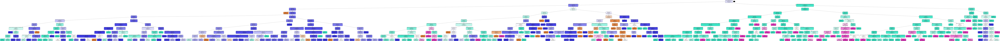

In [22]:
from sklearn.tree import export_graphviz
from IPython.display import Image
import pydotplus
from io import StringIO

# Inisialisasi model Decision Tree dengan hyperparameter terbaik
best_model = DecisionTreeClassifier(random_state=42, class_weight={'LAKU': 1, 'TAP': 1, 'WANPRESTASI': 1, 'BATAL': 1},
                                    max_depth=10, min_samples_leaf=1, min_samples_split=2)

# Latih model dengan data latih
best_model.fit(X_train, y_train)

# Visualisasi decision tree
dot_data = StringIO()
export_graphviz(best_model, out_file=dot_data, filled=True, rounded=True, special_characters=True,
                feature_names=X_encoded.columns, class_names=best_model.classes_.astype(str))
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())


In [34]:
# Simpan model
import joblib
joblib.dump(model, 'decision_tree_model.pkl')

['decision_tree_model.pkl']

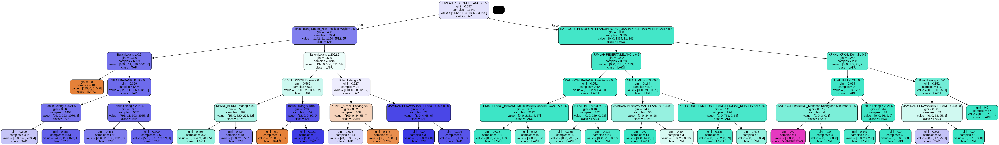

In [23]:
from sklearn.tree import export_graphviz
from IPython.display import Image
import pydotplus
from io import StringIO

# Inisialisasi model Decision Tree dengan hyperparameter terbaik dan batasan kedalaman
best_model = DecisionTreeClassifier(random_state=42, class_weight={'LAKU': 1, 'TAP': 1, 'WANPRESTASI': 1, 'BATAL': 1},
                                    max_depth=5, min_samples_leaf=1, min_samples_split=2)

# Latih model dengan data latih
best_model.fit(X_train, y_train)

# Visualisasi decision tree
dot_data = StringIO()
export_graphviz(best_model, out_file=dot_data, filled=True, rounded=True, special_characters=True,
                feature_names=X_encoded.columns, class_names=best_model.classes_.astype(str))
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())


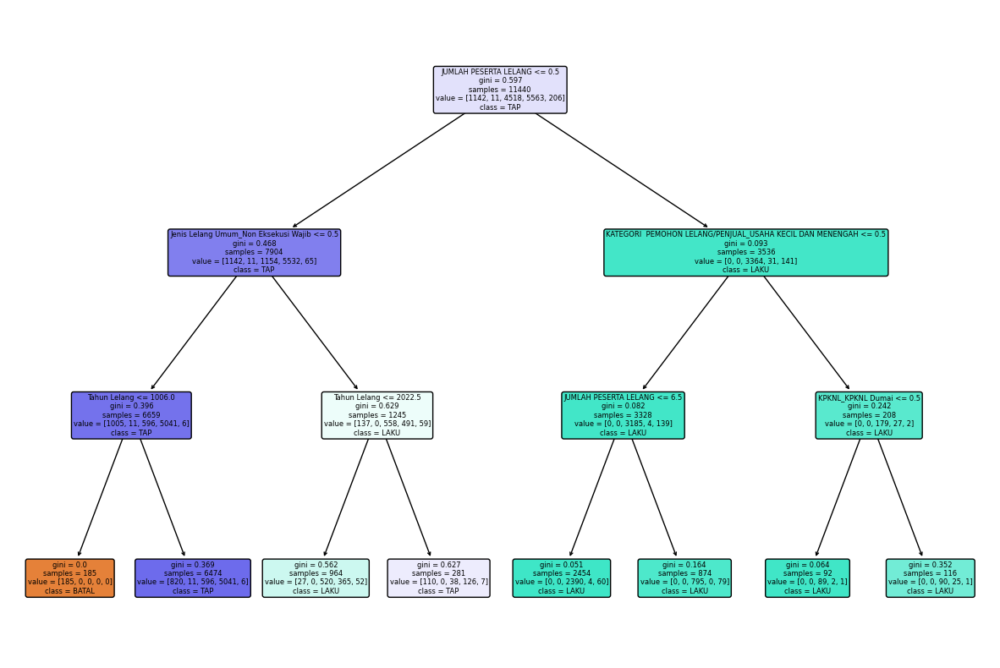

In [24]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt

# Ganti nilai max_depth sesuai keinginan Anda
model = DecisionTreeClassifier(max_depth=3)
model.fit(X_train, y_train)

# Ukuran dan DPI dapat disesuaikan sesuai kebutuhan
fig, ax = plt.subplots(figsize=(15, 10), dpi=100)

# Batasi jumlah batang dengan menambahkan parameter max_depth
plot_tree(model, feature_names=X_encoded.columns, class_names=model.classes_, filled=True, rounded=True, fontsize=6, ax=ax, max_depth=5)

plt.show()


In [25]:
from sklearn.tree import export_graphviz
import graphviz

dot_data = export_graphviz(model, out_file=None, feature_names=X_encoded.columns, class_names=model.classes_, filled=True, rounded=True, special_characters=True)
graph = graphviz.Source(dot_data)
graph.render("decision_tree")
graph.view("decision_tree")


'decision_tree.pdf'

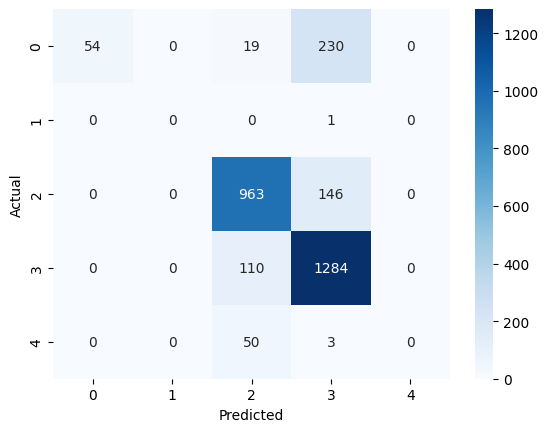

In [26]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

y_pred = model.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


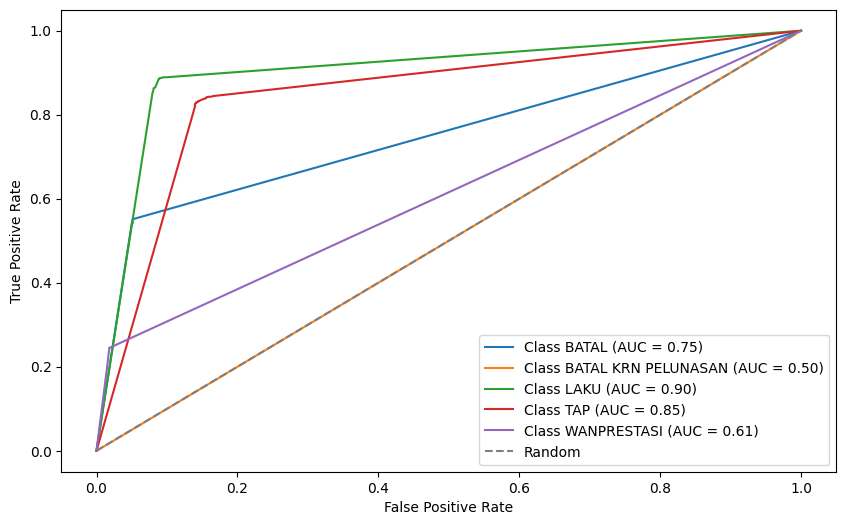

In [27]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize

# Inisialisasi model Decision Tree
model = DecisionTreeClassifier(random_state=42)

# Latih model
model.fit(X_train, y_train)

# Ambil probabilitas prediksi untuk setiap kelas
y_probs = model.predict_proba(X_test)

# Binarize label jika klasifikasi multikelas
y_test_bin = label_binarize(y_test, classes=model.classes_)

# Menghitung kurva ROC dan AUC untuk setiap kelas
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(model.classes_)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot kurva ROC untuk setiap kelas
plt.figure(figsize=(10, 6))
for i in range(len(model.classes_)):
    plt.plot(fpr[i], tpr[i], label=f'Class {model.classes_[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()


In [30]:
with open('app.py', 'w') as f:
    f.write("""
import joblib
from flask import Flask, request, jsonify
import pandas as pd

app = Flask(__name__)

# Muat model
model = joblib.load('decision_tree_model.pkl')

@app.route('/predict', methods=['POST'])
def predict():
    data = request.get_json(force=True)
    # Asumsikan data input dalam bentuk dictionary yang bisa langsung diubah menjadi DataFrame
    df = pd.DataFrame(data)
    prediction = model.predict(df)
    return jsonify({'prediction': prediction.tolist()})

if __name__ == '__main__':
    app.run(host='0.0.0.0', port=5000)
    """)

print("File app.py telah dibuat.")


File app.py telah dibuat.


In [32]:
# Install Flask dan pyngrok
!pip install flask pyngrok

# Atur Authtoken ngrok
!ngrok authtoken 2hVDyhihM0XG0q085zhoqtWdW37_5Md2adFnKXQTh2hyrW8jm

# Buat file app.py
with open('app.py', 'w') as f:
    f.write("""
import joblib
from flask import Flask, request, jsonify
import pandas as pd

app = Flask(__name__)

# Muat model
model = joblib.load('decision_tree_model.pkl')

@app.route('/predict', methods=['POST'])
def predict():
    data = request.get_json(force=True)
    # Asumsikan data input dalam bentuk dictionary yang bisa langsung diubah menjadi DataFrame
    df = pd.DataFrame(data)
    prediction = model.predict(df)
    return jsonify({'prediction': prediction.tolist()})

if __name__ == '__main__':
    app.run(host='0.0.0.0', port=5000)
    """)

# Jalankan Flask App
get_ipython().system_raw('python3 app.py &')

# Expose port 5000
from pyngrok import ngrok
public_url = ngrok.connect(5000)
print(f'Public URL: {public_url}')


Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml
Public URL: NgrokTunnel: "https://e87b-34-106-105-231.ngrok-free.app" -> "http://localhost:5000"


In [38]:
import pickle

# Save the model
with open('decision_tree.pkl', 'wb') as f:
  pickle.dump(model, f)


In [39]:
%%writefile app.py
import streamlit as st
# ... your Streamlit app code here ...

Overwriting app.py
